### Working Notebook - Justin Young

#### Installed Libraries

In [ ]:
%reload_ext watermark

In [ ]:
import pandas as pd
import numpy as np
import requests
import json
from pandas.io.json import json_normalize
from babel.numbers import format_currency
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import seaborn as sns
plt.style.use('ggplot')

import geopandas as gpd
import folium
import shapely.geometry
import shapely.wkt
from folium.plugins import StripePattern
from folium.plugins import MarkerCluster
from shapely.geometry import Polygon
import fiona
from shapely.geometry import shape
import branca.colormap as cm

from sklearn import preprocessing
from sklearn.cluster import KMeans

import statsmodels.api as sm
import statsmodels.formula.api as smf
from causalinference import CausalModel

In [ ]:
%watermark --iversions

seaborn    : 0.11.2
geopandas  : 0.11.1
sklearn    : 1.1.1
json       : 2.0.9
numpy      : 1.23.1
statsmodels: 0.13.2
pandas     : 1.2.5
folium     : 0.12.1.post1
psycopg2   : 2.9.3 (dt dec pq3 ext lo64)
requests   : 2.28.1
fiona      : 1.8.21
branca     : 0.5.0
matplotlib : 3.5.2
shapely    : 1.8.2



##### Function Bank

In [ ]:
# Polygon + Point Functions

def poly_func(df):
    poly_lst = []
    for i in df['geometry.coordinates']:
        df_poly = Polygon(i[0])
        poly_lst.append(df_poly)

    df['poly'] = poly_lst
    df['geometry.coordinates'] = df['geometry.coordinates'].apply(lambda x: list(reversed(x)))
    return df

def point_func(df):
    point_lst = []
    for i in df['geometry.coordinates']:
        df_point = shapely.geometry.Point(i)
        point_lst.append(df_point)

    df['points'] = point_lst
    df['geometry.coordinates'] = df['geometry.coordinates'].apply(lambda x: list(reversed(x)))
    return df

### Data Requests

In [ ]:
# Detroit Zip Code Map Data
#detroit_zipcode_boundaries = requests.get("https://services2.arcgis.com/qvkbeam7Wirps6zC/arcgis/rest/services/ZipCodes/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson").text
#detroit_zipcode_boundaries_json = json.loads(detroit_zipcode_boundaries)
#detroit_zipcode_boundaries_df = pd.json_normalize(detroit_zipcode_boundaries_json['features'])

# Detroit Zip Code Map v2 ShapeFile
geodf_det_zip = gpd.read_file('/work/assets/det_shp/Geography.shp')
geodf_det_zip.columns = geodf_det_zip.columns.str.replace('Key', 'zip_code')
geodf_det_zip = geodf_det_zip.fillna(0).drop_duplicates()

# Detroit Neighborhood Map Data
#detroit_neighborhood_boundaries = requests.get("https://services2.arcgis.com/qvkbeam7Wirps6zC/arcgis/rest/services/Current_City_of_Detroit_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson").text
#detroit_neighborhood_boundaries_json = json.loads(detroit_neighborhood_boundaries)
#detroit_neighborhood_boundaries_df = pd.json_normalize(detroit_neighborhood_boundaries_json['features'])

# Detroit School Boundaries ShapeFile
geodf_dcs = gpd.read_file('/work/assets/sabs_1516/SABS_1516.shp')
geodf_dcs_mi = geodf_dcs[(geodf_dcs['stAbbrev'] == "MI") & (geodf_dcs['level'] != '4') & (geodf_dcs['level'] != '1') & (geodf_dcs['level'] != '3')]
conditions = [
    (geodf_dcs_mi['level'] == '1'),
    (geodf_dcs_mi['level'] == '2'),
    (geodf_dcs_mi['level'] == '3'),
    (geodf_dcs_mi['level'] == '4')
]
values = ['gold','blue','green','white']
geodf_dcs_mi['color'] = np.select(conditions, values)

# US Census Small Area Income and Poverty Estimates (SAIPE)
#saipe_df = pd.read_excel('/work/assets/ussd20.xls')
#saipe_df.columns = saipe_df.iloc[1]
#saipe_df = saipe_df.drop(labels=[0,1], axis=0)

# Demographics by Zip Code Detroit
demo_zip = pd.read_excel('/work/assets/capstone_demographics_2.xlsx',engine='openpyxl')
demo_zip_T = demo_zip.T
demo_zip_T.columns = demo_zip_T.iloc[0]
demo_zip_final = demo_zip_T.iloc[1: , :]
demo_zip_final.reset_index(inplace=True)
demo_zip_final.columns = demo_zip_final.columns.str.replace('index', 'zip_code')
demo_zip_final = demo_zip_final.fillna(0).drop_duplicates()
#demo_zip_final["Basic Variables Income - Family Households Mean Family Household Income"] = demo_zip_final["Basic Variables Income - Family Households Mean Family Household Income"].apply(lambda x: format_currency(x, currency="USD", locale="en_US"))
#demo_zip_final["Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame"] = demo_zip_final["Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame"].apply(lambda x: format_currency(x, currency="USD", locale="en_US"))
#demo_zip_final["Basic Variables Income:Race And Ethnicity - Median Household Income Whi"] = demo_zip_final["Basic Variables Income:Race And Ethnicity - Median Household Income Whi"].apply(lambda x: format_currency(x, currency="USD", locale="en_US"))

# Joined PPE & Testing Datasets (From RW)
ppe_testing_df_all = pd.read_excel('/work/assets/saved_data/all_1819_df_v1.xlsx')
ppe_testing_df_all.drop(['Unnamed: 0','Not Title I Funded','Title I Funded'],axis=1,inplace=True)
    # Expand Multi Level Data
ppe_testing_df_all_melt = pd.pivot(ppe_testing_df_all,index=['SCHOOL YEAR', 'SCH NAME', 'StateLocalPpeSchoolShare',
                                                          'StateLocalPpeDistrictShare', 'FederalPpeSchoolShare',
                                                          'FederalPpeDistrictShare', 'TotalPpeSchoolShare',
                                                          'TotalPpeDistrictShare', 'TotalPpeTotal', 'StreetAddress', 'City',
                                                          'ZipCode', 'Students', 'Teachers', 'studentsperteacher','BuildingName'
                                                          ],#'BuildingOfficialName','IHE Type','Subgroup',
                                                          #'Gender','Total Graduates (All Students)','Total Enrolled in an IHE within 0-6 months',
                                                          #'Total % Enrolled in an IHE within 0-6 months'], 
                                                   columns='Subject',
                                                   values=['NumberAboveAverageGrowth', 'NumberAverageGrowth',
                                                           'NumberBelowAverageGrowth', 'PercentAboveAverage',
                                                           'PercentAverageGrowth', 'PercentBelowAverage', 'TotalIncluded',
                                                           'MeanSGP'])
#ppe_testing_df_all_melt.columns = ppe_testing_df_all_melt.columns.droplevel()
ppe_testing_df_all_melt.columns = ppe_testing_df_all_melt.columns.map('|'.join).str.strip('|')
ppe_testing_df_all_mod = ppe_testing_df_all_melt.rename_axis(None,axis=1)
ppe_testing_df_all_mod = ppe_testing_df_all_mod.reset_index().fillna(0)
ppe_testing_df_all_mod.rename(columns={"SCH NAME": "SCHOOL NAME","ZipCode":"zip_code"},inplace=True)
school_lst = ppe_testing_df_all_mod['SCHOOL NAME'].unique().tolist()

# ADD ZIP DEMOS TO TESTING
ppe_testing_df_all_mod = ppe_testing_df_all_mod.merge(demo_zip_final, on='zip_code', how='inner').drop_duplicates()

# Detroit School Marker Point Data
detroit_school_marker = requests.get("https://services2.arcgis.com/qvkbeam7Wirps6zC/arcgis/rest/services/2018_2019_Schools_(EEM)/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson").text
detroit_school_marker_json = json.loads(detroit_school_marker)
detroit_school_marker_df = pd.json_normalize(detroit_school_marker_json['features'])
detroit_school_marker_df['properties.EntityOfficialName'] = detroit_school_marker_df['properties.EntityOfficialName'].str.upper()
detroit_school_marker_df['properties.EntityOfficialName'] = detroit_school_marker_df['properties.EntityOfficialName'].str.replace(".","")
#detroit_school_marker_df = detroit_school_marker_df[(detroit_school_marker_df['properties.EntityGeographicLEADistrictOffi'] == "Detroit Public Schools Community District") & (detroit_school_marker_df['properties.EntityTypeGroupName'] == "School") & (detroit_school_marker_df['properties.EntityActualGrades'].str.contains("12")) & (detroit_school_marker_df['properties.EntityType'] == 18)]
detroit_school_marker_df = detroit_school_marker_df[detroit_school_marker_df['properties.EntityOfficialName'].isin(school_lst)]
detroit_school_marker_df.rename(columns={"properties.EntityOfficialName": "SCHOOL NAME"},inplace=True)

/shared-libs/python3.9/py/lib/python3.9/site-packages/geopandas/geodataframe.py:1472: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipykernel_2205/3814323732.py:77: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  detroit_school_marker_df['properties.EntityOfficialName'] = detroit_school_marker_df['properties.EntityOfficialName'].str.replace(".","")


In [ ]:
ppe_testing_df_all = pd.read_excel('/work/assets/saved_data/all_1819_df_v1.xlsx')
ppe_testing_df_all

,Unnamed: 0,SCHOOL YEAR,SCH NAME,StateLocalPpeSchoolShare,StateLocalPpeDistrictShare,FederalPpeSchoolShare,FederalPpeDistrictShare,TotalPpeSchoolShare,TotalPpeDistrictShare,TotalPpeTotal,...,Subject,TestingGroup,NumberAboveAverageGrowth,NumberAverageGrowth,NumberBelowAverageGrowth,PercentAboveAverage,PercentAverageGrowth,PercentBelowAverage,TotalIncluded,MeanSGP
0,0,2018-19,COMMUNICATION AND MEDIA ARTS HIGH SCHOOL,7441.53,4590.77,852.03,937.63,8293.56,5528.4,13821.96,...,Social Studies,All Students,34,46,20,34.0,46.0,20.0,100,56.5
1,24,2018-19,COMMUNICATION AND MEDIA ARTS HIGH SCHOOL,7441.53,4590.77,852.03,937.63,8293.56,5528.4,13821.96,...,English Language Arts,All Students,22,50,29,21.8,49.5,28.7,101,46.1
2,51,2018-19,COMMUNICATION AND MEDIA ARTS HIGH SCHOOL,7441.53,4590.77,852.03,937.63,8293.56,5528.4,13821.96,...,Mathematics,All Students,26,39,36,25.7,38.6,35.6,101,47.3
3,66,2018-19,DETROIT SCHOOL OF ARTS,9830.65,4590.77,1213.57,937.63,11044.22,5528.4,16572.62,...,Social Studies,All Students,16,46,29,17.6,50.5,31.9,91,45.0
4,110,2018-19,DETROIT SCHOOL OF ARTS,9830.65,4590.77,1213.57,937.63,11044.22,5528.4,16572.62,...,English Language Arts,All Students,14,29,47,15.6,32.2,52.2,90,36.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,1716,2018-19,EAST ENGLISH VILLAGE PREPARATORY ACADEMY,7632.50,4590.77,1506.62,937.63,9139.12,5528.4,14667.52,...,Mathematics,All Students,25,62,101,13.3,33.0,53.7,188,34.4
71,1736,2018-19,EAST ENGLISH VILLAGE PREPARATORY ACADEMY,7632.50,4590.77,1506.62,937.63,9139.12,5528.4,14667.52,...,Science,All Students,5,5,5,18.8,43.8,37.5,16,45.3
72,1758,2018-19,ACADEMY OF THE AMERICAS HIGH SCHOOL,7661.38,4590.77,4146.73,937.63,11808.11,5528.4,17336.51,...,English Language Arts,All Students,5,13,5,25.9,48.1,25.9,27,51.8
73,1790,2018-19,ACADEMY OF THE AMERICAS HIGH SCHOOL,7661.38,4590.77,4146.73,937.63,11808.11,5528.4,17336.51,...,Mathematics,All Students,5,13,12,13.8,44.8,41.4,29,38.8


In [ ]:
# DATAFRAME STYLER
"""
col_lst_keep = ["zip_code",
                "Basic Variables - Mean Household Size",
                "Basic Variables - Mean Household Size (FAMILY)",
                "Basic Variables - Mean Household Size (NON FAMILY)"]

col_lst_style = ["Basic Variables - Total Population",
           "Basic Variables - Total Households",
           "Basic Variables - Total Families",
           "Basic Variables Educational Attainment - Total Population 25+",
           "Basic Variables Educational Attainment - No Schooling Completed",
           "Basic Variables Educational Attainment - High School Graduate/GED",
           "Basic Variables Educational Attainment - Some College <1 Year",
           "Basic Variables Educational Attainment - Some College >1 Year No Degree",
           "Basic Variables Educational Attainment - Master's Degree",
           "Basic Variables Household Size - One Person,  Male Householder",
           "Basic Variables Household Size - Two people, Husband/Wife Family, Own Child",
           "Basic Variables Household Size - Two people, Husband/Wife Family, No Own Child",
           "Basic Variables Household Size - Other Family Household, Male Householder, No Own Child",
           "Basic Variables Household Size - Other Family Household, Female Householder, Own Child",
           "Basic Variables Household Size - Other Family Household, Female Householder, No Own Child",
           "Basic Variables Household Size - NonFamily Household, Two people, Male Householder",
           "Basic Variables Household Size - NonFam Household, Two people, Female Householder",
           "Basic Variables Household Size - Total Households",
           "Basic Variables Household Size - 2-Person Households",
           "Basic Variables Household Size - 3-Person Households",
           "Basic Variables Household Size - 4-Person Households",
           "Basic Variables Household Size - 6-Person Households",
           "Basic Variables Household Size - 7+ Person Households",
           "Basic Variables Income - Family Households Mean Family Household Income",
           "Basic Variables Income Race And Ethnicity - Total BlacAfric Ame Households",
           "Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame",
           "Basic Variables Income:Race And Ethnicity - Total Whi Households",
           "Basic Variables Income:Race And Ethnicity - Median Household Income Whi",
           "Husband-Wife Family, Own Children, Below Poverty",
           "Male Hholder, Own Children, Below Poverty",
           "Female Hholder, Own Children, Below Poverty",
           "Husband-Wife Family, Own Children, At/Above Poverty",
           "Male Hholder, Own Children, At/Above Poverty",
           "Female Hholder, Own Children, At/Above Poverty",
           "Basic Variables School Enrollment (Pop 3+):Total-Gra 9 to gra 12",
           "Basic Variables School Enrollment (Pop 3+):Total:Public And Private School-Gra 5- gra 8: Publ sch",
           "Basic Variables School Enrollment (Pop 3+):Total:Public And Private School-Gra 5- gra 8: Priv sch",
           "Basic Variables School Enrollment (Pop 3+):Total:Public And Private School-Gra 9 to gra 12: Publ sch",
           "Basic Variables School Enrollment (Pop 3+):Total:Public And Private School-Gra 9 to gra 12: Priv sch"]
"""
#style_df = demo_zip_final[col_lst_style].style.format(lambda x : '{:,.0f}'.format(x))
#style_df = style_df.data
#keep_df = demo_zip_final[col_lst_keep]
#frames = [keep_df,style_df]  
#demo_zip_final = pd.concat(frames,axis=1)
### STILL NEEDS SOME WORK TO STYLE THE DATAFRAME BUT NOT REALLY NESSESSARY ###

'\ncol_lst_keep = ["zip_code",\n                "Basic Variables - Mean Household Size",\n                "Basic Variables - Mean Household Size (FAMILY)",\n                "Basic Variables - Mean Household Size (NON FAMILY)"]\n\ncol_lst_style = ["Basic Variables - Total Population",\n           "Basic Variables - Total Households",\n           "Basic Variables - Total Families",\n           "Basic Variables Educational Attainment - Total Population 25+",\n           "Basic Variables Educational Attainment - No Schooling Completed",\n           "Basic Variables Educational Attainment - High School Graduate/GED",\n           "Basic Variables Educational Attainment - Some College <1 Year",\n           "Basic Variables Educational Attainment - Some College >1 Year No Degree",\n           "Basic Variables Educational Attainment - Master\'s Degree",\n           "Basic Variables Household Size - One Person,  Male Householder",\n           "Basic Variables Household Size - Two people, Husband

### Graphs

/tmp/ipykernel_2205/621129518.py:54: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(det_school_cluster_df.corr(), dtype=np.bool))


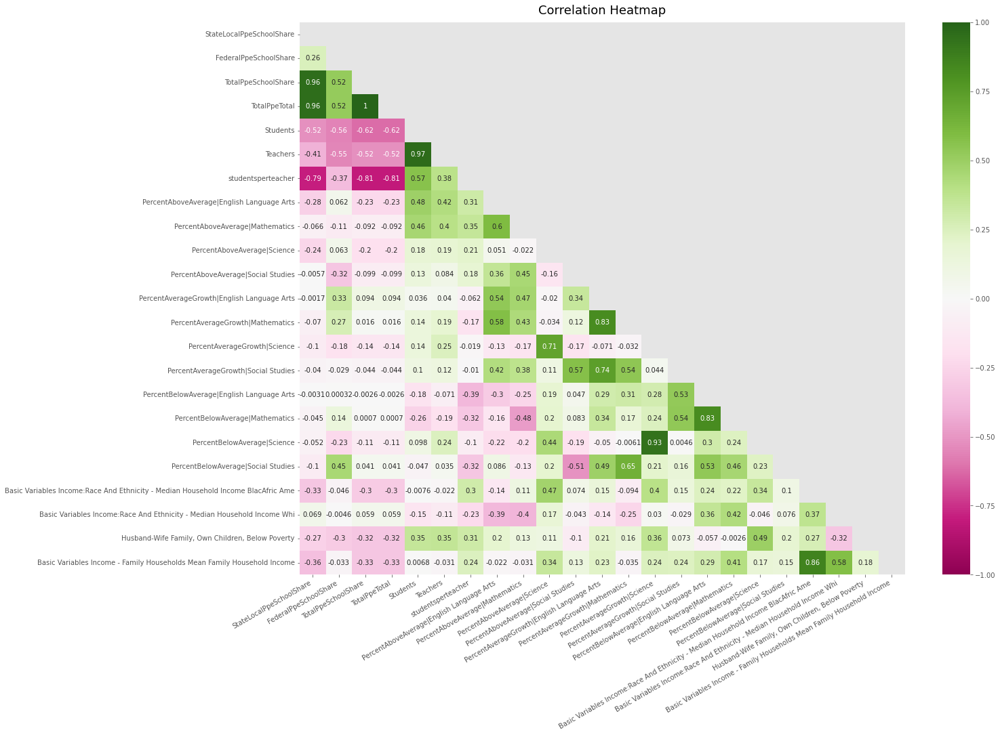

In [ ]:
det_school_testing_mod = ppe_testing_df_all_mod[['SCHOOL NAME',
                                                'StateLocalPpeSchoolShare',
                                                #'StateLocalPpeDistrictShare',
                                                'FederalPpeSchoolShare',
                                                #'FederalPpeDistrictShare',
                                                'TotalPpeSchoolShare',
                                                #'TotalPpeDistrictShare',
                                                'TotalPpeTotal',
                                                'Students',
                                                'Teachers',
                                                'studentsperteacher',
                                                #'NumberAboveAverageGrowth|English Language Arts',
                                                #'NumberAboveAverageGrowth|Mathematics',
                                                #'NumberAboveAverageGrowth|Science',
                                                #'NumberAboveAverageGrowth|Social Studies',
                                                #'NumberAverageGrowth|English Language Arts',
                                                #'NumberAverageGrowth|Mathematics',
                                                #'NumberAverageGrowth|Science',
                                                #'NumberAverageGrowth|Social Studies',
                                                #'NumberBelowAverageGrowth|English Language Arts',
                                                #'NumberBelowAverageGrowth|Mathematics',
                                                #'NumberBelowAverageGrowth|Science',
                                                #'NumberBelowAverageGrowth|Social Studies',
                                                'PercentAboveAverage|English Language Arts',
                                                'PercentAboveAverage|Mathematics',
                                                'PercentAboveAverage|Science',
                                                'PercentAboveAverage|Social Studies',
                                                'PercentAverageGrowth|English Language Arts',
                                                'PercentAverageGrowth|Mathematics',
                                                'PercentAverageGrowth|Science',
                                                'PercentAverageGrowth|Social Studies',
                                                'PercentBelowAverage|English Language Arts',
                                                'PercentBelowAverage|Mathematics',
                                                'PercentBelowAverage|Science',
                                                'PercentBelowAverage|Social Studies',
                                                #'TotalIncluded|English Language Arts',
                                                #'TotalIncluded|Mathematics',
                                                #'TotalIncluded|Science',
                                                #'TotalIncluded|Social Studies',
                                                #'MeanSGP|English Language Arts',
                                                #'MeanSGP|Mathematics',
                                                #'MeanSGP|Science',
                                                #'MeanSGP|Social Studies',
                                                'Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame',
                                                'Basic Variables Income:Race And Ethnicity - Median Household Income Whi',
                                                'Husband-Wife Family, Own Children, Below Poverty',
                                                'Basic Variables Income - Family Households Mean Family Household Income',
                                                ]].copy()
det_school_cluster_df = det_school_testing_mod.reset_index().sort_values(by=['SCHOOL NAME'])
det_school_cluster_df = det_school_cluster_df.rename_axis(None, axis=1).reset_index(drop=True)
det_school_cluster_df = det_school_cluster_df.drop(columns=['index'])

# Correlation Heatmap
mask = np.triu(np.ones_like(det_school_cluster_df.corr(), dtype=np.bool))
plt.figure(figsize=(20, 15))
heatmap = sns.heatmap(det_school_cluster_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
plt.xticks(rotation=30, horizontalalignment='right')
plt.show()

# DESCRIBE PLOT ALL
#det_school_cluster_describe = det_school_cluster_df.describe()
#corrmat = det_school_cluster_describe.corr()
#plt.figure(figsize=(20, 15))
#sns.heatmap(corrmat, vmax=1, annot=True, linewidths=.5, cmap="PiYG")
#plt.xticks(rotation=30, horizontalalignment='right')
#plt.show()

# DESCRIBE PLOT1
#det_school_cluster_describe = det_school_cluster_df.describe()
#corrmat = det_school_cluster_describe.corr()
#plt.figure(figsize=(30, 20))
#sns.heatmap(corrmat.iloc[:,:21], vmax=1, annot=True, linewidths=.5, cmap="PiYG")
#plt.xticks(rotation=30, horizontalalignment='right')
#plt.show()

# DESCRIBE PLOT2
#det_school_cluster_describe = det_school_cluster_df.describe()
#corrmat = det_school_cluster_describe.corr()
#lt.figure(figsize=(30, 20))
#sns.heatmap(corrmat.iloc[:,21:], vmax=1, annot=True, linewidths=.5, cmap="PiYG")
#plt.xticks(rotation=30, horizontalalignment='right')
#plt.show()

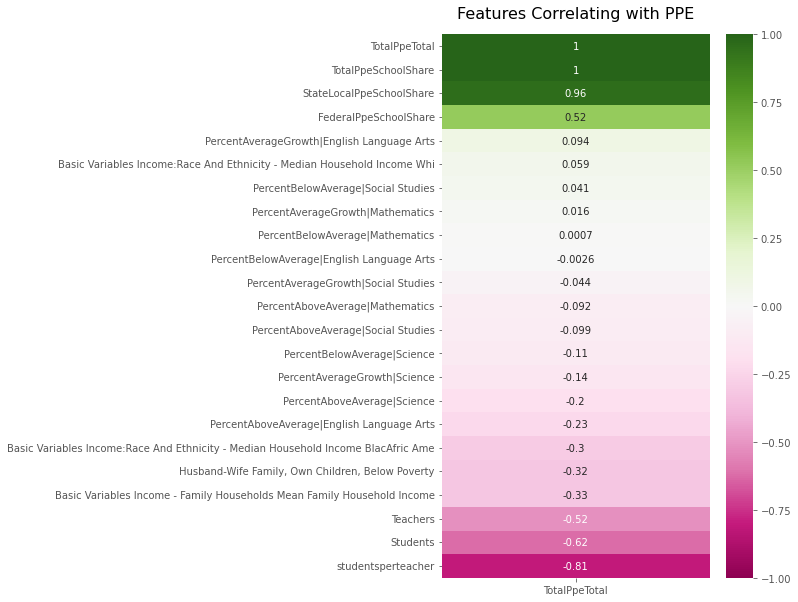

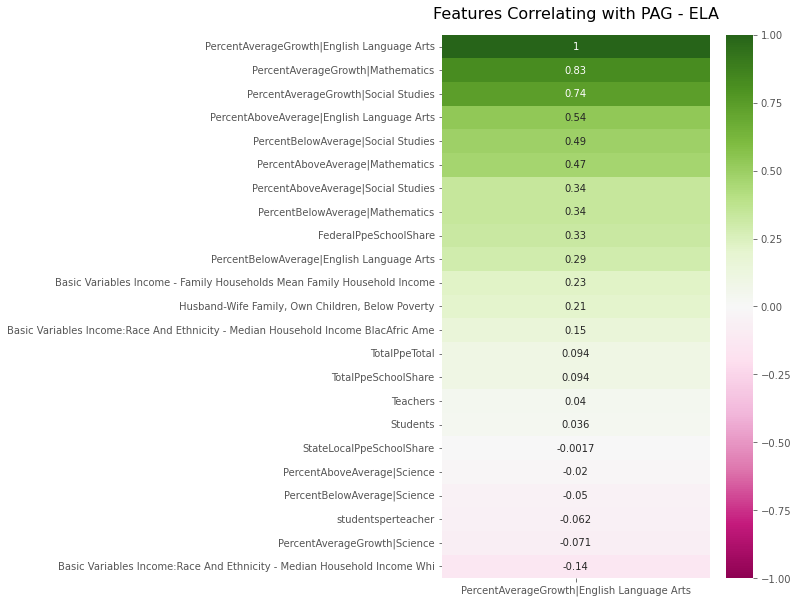

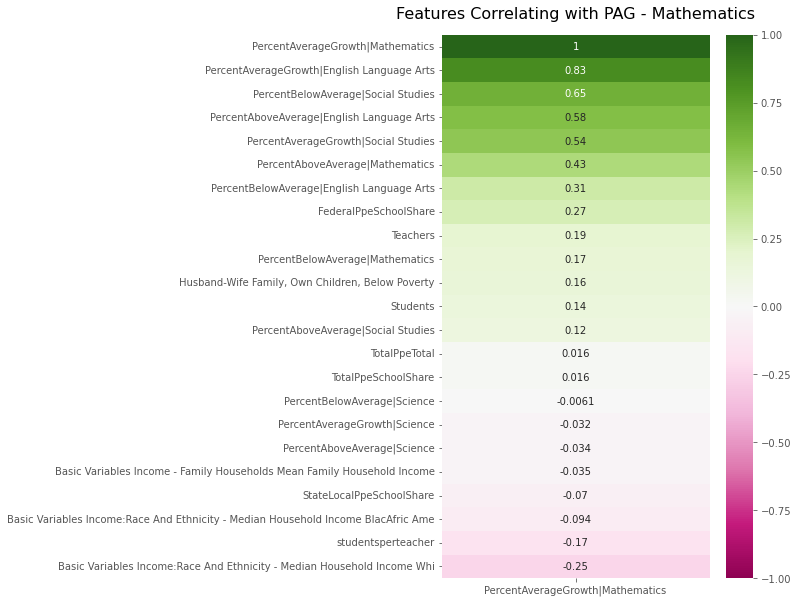

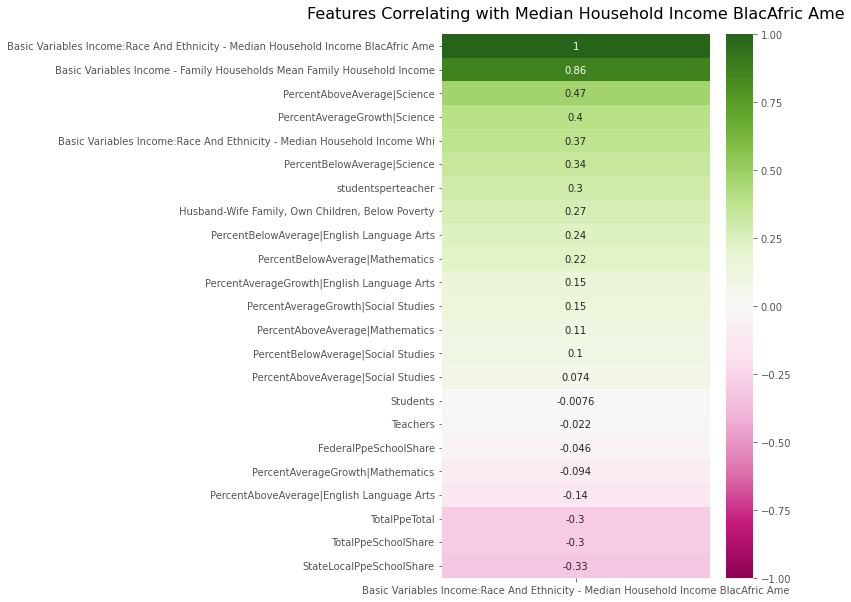

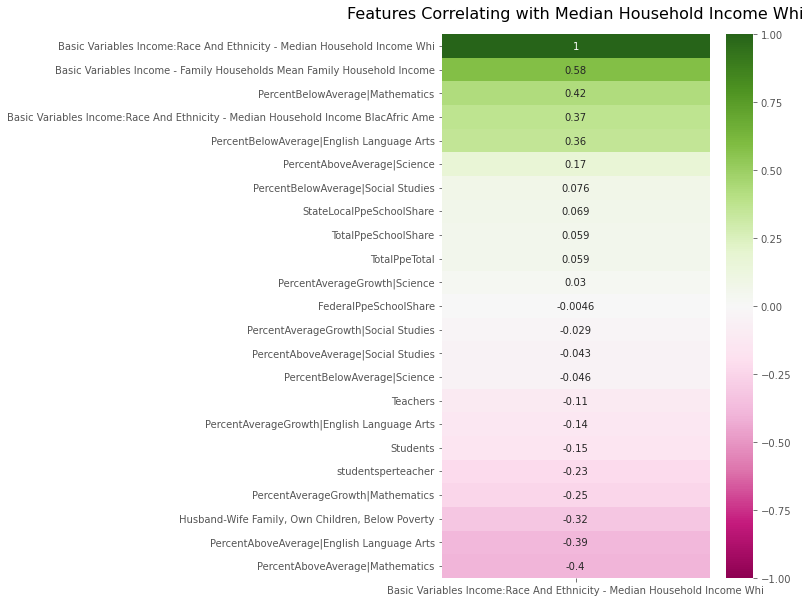

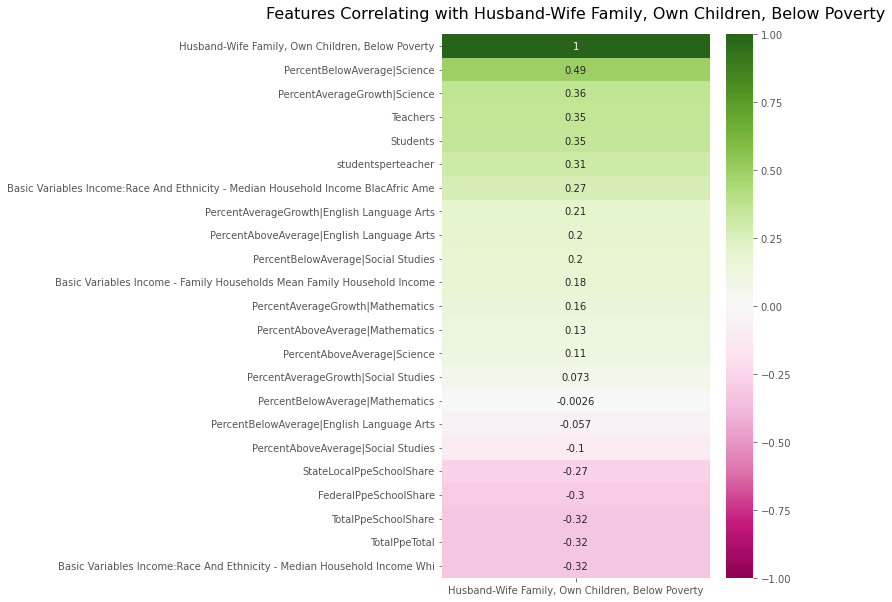

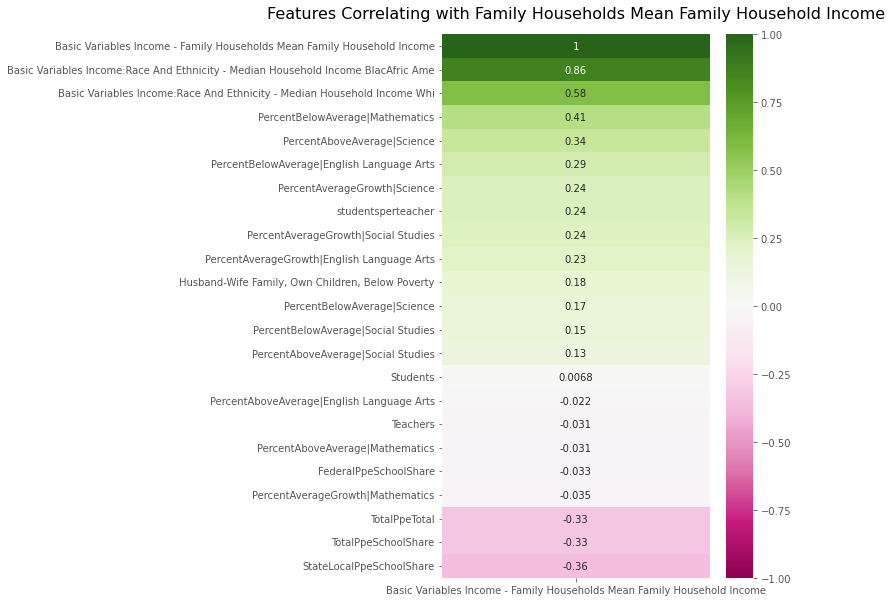

In [ ]:
#Features Correlation

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['TotalPpeTotal']].sort_values(by='TotalPpeTotal', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with PPE', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['PercentAverageGrowth|English Language Arts']].sort_values(by='PercentAverageGrowth|English Language Arts', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with PAG - ELA', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['PercentAverageGrowth|Mathematics']].sort_values(by='PercentAverageGrowth|Mathematics', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with PAG - Mathematics', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame']].sort_values(by='Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with Median Household Income BlacAfric Ame', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['Basic Variables Income:Race And Ethnicity - Median Household Income Whi']].sort_values(by='Basic Variables Income:Race And Ethnicity - Median Household Income Whi', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with Median Household Income Whi', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['Husband-Wife Family, Own Children, Below Poverty']].sort_values(by='Husband-Wife Family, Own Children, Below Poverty', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with Husband-Wife Family, Own Children, Below Poverty', fontdict={'fontsize':16}, pad=16);

plt.figure(figsize=(6, 10))
heatmap = sns.heatmap(det_school_cluster_df.corr()[['Basic Variables Income - Family Households Mean Family Household Income']].sort_values(by='Basic Variables Income - Family Households Mean Family Household Income', ascending=False), vmin=-1, vmax=1, annot=True, cmap='PiYG')
heatmap.set_title('Features Correlating with Family Households Mean Family Household Income', fontdict={'fontsize':16}, pad=16);

Pearsons correlation Math: 0.016
Pearsons correlation ELA: 0.094
Pearsons correlation Family/Poverty: -0.323
Pearsons correlation HH Income: -0.326


<AxesSubplot:xlabel='TotalPpeTotal', ylabel='Basic Variables Income - Family Households Mean Family Household Income'>

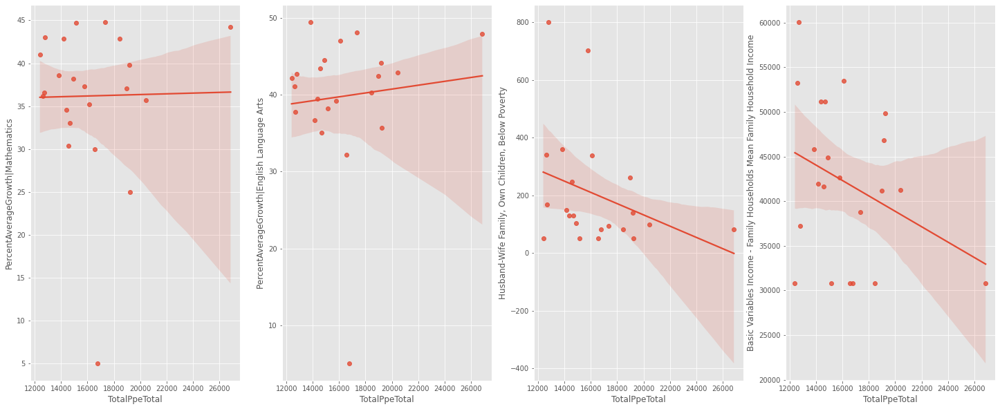

In [ ]:
# REGRESSION PLOT #
corr1, _ = pearsonr(det_school_cluster_df['TotalPpeTotal'], det_school_cluster_df['PercentAverageGrowth|Mathematics'])
corr2, _ = pearsonr(det_school_cluster_df['TotalPpeTotal'], det_school_cluster_df['PercentAverageGrowth|English Language Arts'])
corr3, _ = pearsonr(det_school_cluster_df['TotalPpeTotal'], det_school_cluster_df['Husband-Wife Family, Own Children, Below Poverty'])
corr4, _ = pearsonr(det_school_cluster_df['TotalPpeTotal'], det_school_cluster_df['Basic Variables Income - Family Households Mean Family Household Income'])
print('Pearsons correlation Math: %.3f' % corr1)
print('Pearsons correlation ELA: %.3f' % corr2)
print('Pearsons correlation Family/Poverty: %.3f' % corr3)
print('Pearsons correlation HH Income: %.3f' % corr4)
#plt.show()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4)
fig.set_size_inches(25, 10)
sns.regplot(x=det_school_cluster_df['TotalPpeTotal'], y=det_school_cluster_df['PercentAverageGrowth|Mathematics'], ax=ax1)
sns.regplot(x=det_school_cluster_df['TotalPpeTotal'], y=det_school_cluster_df['PercentAverageGrowth|English Language Arts'], ax=ax2)
sns.regplot(x=det_school_cluster_df['TotalPpeTotal'], y=det_school_cluster_df['Husband-Wife Family, Own Children, Below Poverty'], ax=ax3)
sns.regplot(x=det_school_cluster_df['TotalPpeTotal'], y=det_school_cluster_df['Basic Variables Income - Family Households Mean Family Household Income'], ax=ax4)


In [ ]:
#df_ppe_testing_pp = df_ppe_testing.drop(columns=['TotalPpeDistrictShare','FederalPpeDistrictShare','StateLocalPpeDistrictShare','id',
#                                                 'properties.EntityType','properties.EntityTypeGroup','properties.EntityTypeCategory','properties.EntityCountyCode',
#                                                 'properties.EntityGeographicLEADistrictCode','properties.EntityOpenDate','properties.EntityFIPSCode',	
#                                                 'properties.EnttiyREMCid','properties.ReceivesTransportationServicesF','properties.EntityPhone','properties.EntityFax','properties.EntityMailingZip4','properties.ObjectId'])

##sns.pairplot(df_ppe_testing_pp, hue="SCHOOL NAME")
#corr = df_ppe_testing_pp.corr()
#corr.style.background_gradient(cmap='coolwarm')

### Clustering

In [ ]:
det_school_X1 = det_school_cluster_df.iloc[:,1:43]
det_school_X1 = preprocessing.scale(det_school_X1)

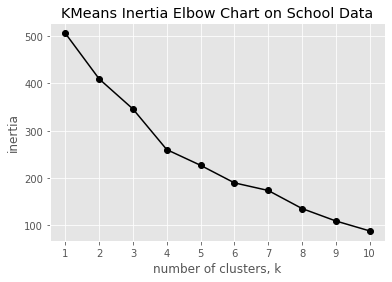

In [ ]:
ks = range(1,11) #Set Range for Looping to 10
inertia = [] #Initiate Inertia List

for k in ks:
    model = KMeans(n_clusters = k) #Execute Kmeans Cluster Algo
    model.fit(det_school_X1) #Fitting Kmeans Cluster Model
    inertia.append(model.inertia_) #Add Clusters to Inertia List
    
plt.plot(ks, inertia, '-o', color='black') #Plot Cluster Elbow Chart
plt.xlabel('number of clusters, k') #Label x Axis Chart
plt.ylabel('inertia') #Label y Axis Chart
plt.title('KMeans Inertia Elbow Chart on School Data') #Label Title Chart
plt.xticks(ks) #Set x Ticks
plt.show() #Show Chart

In [ ]:
det_km = KMeans(n_clusters=4)
det_km.fit(det_school_X1) #fit model on 4 clusters
det_predict = det_km.predict(det_school_X1) #execute predictions for kmeans clusters with 4 clusters

In [ ]:
det_school_cluster_df['cluster'] = pd.Series(det_predict, index=det_school_cluster_df.index) #join dataframs
det_school_cluster_df.head() #Showing Head for Confirmation

,SCHOOL NAME,StateLocalPpeSchoolShare,FederalPpeSchoolShare,TotalPpeSchoolShare,TotalPpeTotal,Students,Teachers,studentsperteacher,PercentAboveAverage|English Language Arts,PercentAboveAverage|Mathematics,...,PercentAverageGrowth|Social Studies,PercentBelowAverage|English Language Arts,PercentBelowAverage|Mathematics,PercentBelowAverage|Science,PercentBelowAverage|Social Studies,Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame,Basic Variables Income:Race And Ethnicity - Median Household Income Whi,"Husband-Wife Family, Own Children, Below Poverty",Basic Variables Income - Family Households Mean Family Household Income,cluster
0,ACADEMY OF THE AMERICAS HIGH SCHOOL,7661.38,4146.73,11808.11,17336.51,123,7.0,17.571429,25.9,13.8,...,37.9,25.9,41.4,0.0,51.7,13520.0,28217.0,94.0,38777.0,3
1,BENJAMIN CARSON HIGH SCHOOL OF SCIENCE AND MED...,8109.36,1507.06,9616.42,15144.82,383,23.0,16.652174,14.5,13.2,...,40.3,47.4,42.1,0.0,37.7,10762.0,24768.0,50.0,30842.0,3
2,CASS TECHNICAL HIGH SCHOOL,6110.61,753.91,6864.52,12392.92,2393,109.0,21.954128,22.8,27.8,...,39.0,35.0,31.1,0.0,40.0,10762.0,24768.0,50.0,30842.0,1
3,CENTRAL HIGH SCHOOL,6756.73,1884.08,8640.81,14169.21,306,21.5,14.232558,12.2,6.1,...,27.3,51.0,51.0,0.0,70.9,22129.0,45962.0,148.0,41940.0,0
4,CODY HIGH SCHOOL,9466.99,757.77,10224.76,15753.16,704,54.5,12.917431,8.5,7.5,...,35.5,52.3,55.2,63.6,53.6,28242.0,28948.0,702.0,42657.0,0


In [ ]:
# INTERPRET
cluster_groups = det_school_cluster_df.groupby(['cluster']).agg(['mean']).round(2).reset_index()
cluster_groups

,cluster,StateLocalPpeSchoolShare,FederalPpeSchoolShare,TotalPpeSchoolShare,TotalPpeTotal,Students,Teachers,studentsperteacher,PercentAboveAverage|English Language Arts,PercentAboveAverage|Mathematics,...,PercentAverageGrowth|Science,PercentAverageGrowth|Social Studies,PercentBelowAverage|English Language Arts,PercentBelowAverage|Mathematics,PercentBelowAverage|Science,PercentBelowAverage|Social Studies,Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame,Basic Variables Income:Race And Ethnicity - Median Household Income Whi,"Husband-Wife Family, Own Children, Below Poverty",Basic Variables Income - Family Households Mean Family Household Income
,,mean,mean,mean,mean,mean,mean,mean,mean,mean,...,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
0,0,7292.63,1797.45,9090.08,14618.48,630.57,35.29,18.44,13.04,12.03,...,14.31,37.27,47.10,52.26,17.30,50.70,30895.29,45172.14,266.43,48868.71
1,1,6771.78,997.44,7769.22,13297.62,1423.40,64.40,22.29,24.08,23.52,...,1.00,41.18,31.94,37.04,1.00,35.74,21774.20,33079.80,331.00,42390.40
2,2,10167.16,1077.99,11245.15,16773.55,482.00,23.00,20.96,5.00,5.00,...,0.00,5.00,5.00,5.00,0.00,5.00,15461.00,37354.00,83.00,30789.00
3,3,11050.80,2546.05,13596.85,19125.25,290.11,22.06,13.26,16.74,13.70,...,1.11,39.56,41.90,48.16,1.11,43.13,17136.33,38056.78,101.22,37899.44


<AxesSubplot:xlabel='TotalPpeTotal', ylabel='PercentAverageGrowth|English Language Arts'>

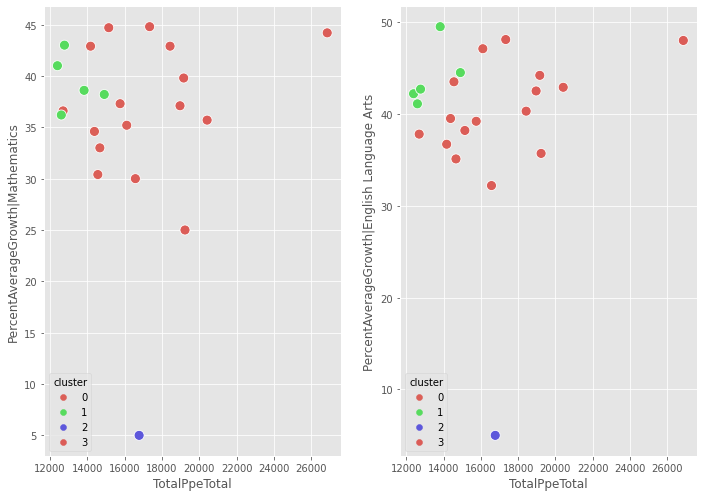

In [ ]:
# CLUSTER SCATTERPLOT #
fig, (ax1, ax2) = plt.subplots(1,2)
fig.set_size_inches(11.7, 8.27)

sns.scatterplot(x=det_school_cluster_df['TotalPpeTotal'], y=det_school_cluster_df['PercentAverageGrowth|Mathematics'], ax=ax1, hue=det_school_cluster_df['cluster'], palette='hls', s=100)
sns.scatterplot(x=det_school_cluster_df['TotalPpeTotal'], y=det_school_cluster_df['PercentAverageGrowth|English Language Arts'], ax=ax2, hue=det_school_cluster_df['cluster'], palette='hls', s=100)

### Causal Inference


In [ ]:
# Copy DF
ci_df = det_school_cluster_df.copy()

ci_df['ln_PercentAverageGrowth|Mathematics'] = np.log(ci_df['PercentAverageGrowth|Mathematics'])
ci_df['ln_PercentAverageGrowth|English Language Arts'] = np.log(ci_df['PercentAverageGrowth|English Language Arts'])
ci_df['ln_TotalPpeTotal'] = np.log(ci_df['TotalPpeTotal'])

ci_df['binary_ppe'] = [1 if x >= ci_df['TotalPpeTotal'].mean() else 0 for x in ci_df['TotalPpeTotal']]
ci_df['binary_math'] = [1 if x >= ci_df['PercentAverageGrowth|Mathematics'].mean() else 0 for x in ci_df['PercentAverageGrowth|Mathematics']]
ci_df['binary_ela'] = [1 if x >= ci_df['PercentAverageGrowth|English Language Arts'].mean() else 0 for x in ci_df['PercentAverageGrowth|English Language Arts']]
ci_df['binary_income'] = [1 if x >= ci_df['Basic Variables Income - Family Households Mean Family Household Income'].mean() else 0 for x in ci_df['Basic Variables Income - Family Households Mean Family Household Income']]

# Adjust Dataframe Column
ci_df['FamilyHouseholdsMeanFamilyHouseholdIncome'] = ci_df['Basic Variables Income - Family Households Mean Family Household Income']
ci_df['PercentAverageGrowth_Mathematics'] = ci_df['PercentAverageGrowth|Mathematics']
ci_df['ln_PercentAverageGrowth_Mathematics'] = ci_df['ln_PercentAverageGrowth|Mathematics']
ci_df['PercentAverageGrowth_ELA'] = ci_df['PercentAverageGrowth|English Language Arts']
ci_df['ln_PercentAverageGrowth_ELA'] = ci_df['ln_PercentAverageGrowth|English Language Arts']
ci_df['HusbandWifeFamilyOwnChildrenBelowPoverty'] = ci_df['Husband-Wife Family, Own Children, Below Poverty']

ci_df

,SCHOOL NAME,StateLocalPpeSchoolShare,FederalPpeSchoolShare,TotalPpeSchoolShare,TotalPpeTotal,Students,Teachers,studentsperteacher,PercentAboveAverage|English Language Arts,PercentAboveAverage|Mathematics,...,binary_ppe,binary_math,binary_ela,binary_income,FamilyHouseholdsMeanFamilyHouseholdIncome,PercentAverageGrowth_Mathematics,ln_PercentAverageGrowth_Mathematics,PercentAverageGrowth_ELA,ln_PercentAverageGrowth_ELA,HusbandWifeFamilyOwnChildrenBelowPoverty
0,ACADEMY OF THE AMERICAS HIGH SCHOOL,7661.38,4146.73,11808.11,17336.51,123,7.0,17.571429,25.9,13.8,...,1,1,1,0,38777.0,44.8,3.802208,48.1,3.873282,94.0
1,BENJAMIN CARSON HIGH SCHOOL OF SCIENCE AND MED...,8109.36,1507.06,9616.42,15144.82,383,23.0,16.652174,14.5,13.2,...,0,1,0,0,30842.0,44.7,3.799974,38.2,3.642836,50.0
2,CASS TECHNICAL HIGH SCHOOL,6110.61,753.91,6864.52,12392.92,2393,109.0,21.954128,22.8,27.8,...,0,1,1,0,30842.0,41.0,3.713572,42.2,3.742420,50.0
3,CENTRAL HIGH SCHOOL,6756.73,1884.08,8640.81,14169.21,306,21.5,14.232558,12.2,6.1,...,0,1,0,0,41940.0,42.9,3.758872,36.7,3.602777,148.0
4,CODY HIGH SCHOOL,9466.99,757.77,10224.76,15753.16,704,54.5,12.917431,8.5,7.5,...,0,1,0,1,42657.0,37.3,3.618993,39.2,3.668677,702.0
5,COMMUNICATION AND MEDIA ARTS HIGH SCHOOL,7441.53,852.03,8293.56,13821.96,577,24.0,24.041667,21.8,25.7,...,0,1,1,1,45789.0,38.6,3.653252,49.5,3.901973,360.0
6,DAVIS AEROSPACE TECHNICAL HIGH SCHOOL AT GOLIG...,11755.53,3135.92,14891.46,20419.86,168,12.0,14.000000,16.7,11.9,...,1,0,1,0,41213.0,35.7,3.575151,42.9,3.758872,99.0
7,DENBY HIGH SCHOOL,6224.89,2623.23,8848.12,14376.52,505,26.5,19.056604,14.8,11.1,...,0,0,0,1,51172.0,34.6,3.543854,39.5,3.676301,130.0
8,DETROIT COLLEGIATE PREPARATORY HIGH SCHOOL AT ...,9727.91,3175.51,12903.42,18431.82,429,31.5,13.619048,16.1,19.0,...,1,1,1,0,30789.0,42.9,3.758872,40.3,3.696351,83.0
9,DETROIT INTERNATIONAL ACADEMY FOR YOUNG WOMEN,11082.54,2551.86,13634.39,19162.79,263,24.5,10.734694,20.9,9.1,...,1,1,1,1,46793.0,39.8,3.683867,44.2,3.788725,140.0


##### Mean Differences

In [ ]:
# PPE Binary - Math
pop_upPpe_mean_math = ci_df.query("binary_ppe==1")['ln_PercentAverageGrowth|Mathematics'].mean()
pop_downPpe_mean_math = ci_df.query("binary_ppe==0")['ln_PercentAverageGrowth|Mathematics'].mean()
mean_diffppe_math = round(pop_upPpe_mean_math-pop_downPpe_mean_math, 4)

# PPE Binary - ELA
pop_upPpe_mean_ela = ci_df.query("binary_ppe==1")['ln_PercentAverageGrowth|English Language Arts'].mean()
pop_downPpe_mean_ela = ci_df.query("binary_ppe==0")['ln_PercentAverageGrowth|English Language Arts'].mean()
mean_diffppe_ela = round(pop_upPpe_mean_ela-pop_downPpe_mean_ela, 4)

# INCOME Binary - Math
pop_upIncome_mean_math = ci_df.query("binary_income==1")['ln_PercentAverageGrowth|Mathematics'].mean()
pop_downIncome_mean_math = ci_df.query("binary_income==0")['ln_PercentAverageGrowth|Mathematics'].mean()
mean_diffincome_math = round(pop_upIncome_mean_math-pop_downIncome_mean_math, 4)

# INCOME Binary - ELA
pop_upIncome_mean_ela = ci_df.query("binary_income==1")['ln_PercentAverageGrowth|English Language Arts'].mean()
pop_downIncome_mean_ela = ci_df.query("binary_income==0")['ln_PercentAverageGrowth|English Language Arts'].mean()
mean_diffincome_ela = round(pop_upIncome_mean_ela-pop_downIncome_mean_ela, 4)

# INCOME Binary - PPE
pop_upIncome_mean_ppe = ci_df.query("binary_income==1")['ln_TotalPpeTotal'].mean()
pop_downIncome_mean_ppe = ci_df.query("binary_income==0")['ln_TotalPpeTotal'].mean()
mean_diffincome_ppe = round(pop_upIncome_mean_ppe-pop_downIncome_mean_ppe, 4)

print("Mean Diff - PPE/Math:",mean_diffppe_math)
print("Mean Diff - PPE/ELA:",mean_diffppe_ela)
print("Mean Diff - INCOME/Math:",mean_diffincome_math)
print("Mean Diff - INCOME/ELA:",mean_diffincome_ela)
print("Mean Diff - INCOME/PPE:",mean_diffincome_ppe)

Mean Diff - PPE/Math: -0.2437
Mean Diff - PPE/ELA: -0.2284
Mean Diff - INCOME/Math: 0.0611
Mean Diff - INCOME/ELA: 0.171
Mean Diff - INCOME/PPE: -0.0929


##### Causal Model

In [ ]:
#1
cm1 = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_Mathematics.values,
    D=ci_df.binary_ppe.values,
    X=ci_df.FamilyHouseholdsMeanFamilyHouseholdIncome.values)

cm1.est_via_matching()

ate1 = round(cm1.estimates['matching']['ate'],4)
print("Avg. Treatement Effect PAG_Math, PPR, INCOME:", ate1)

#2
cm2 = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_ELA.values,
    D=ci_df.binary_ppe.values,
    X=ci_df.FamilyHouseholdsMeanFamilyHouseholdIncome.values)

cm2.est_via_matching()

ate2 = round(cm2.estimates['matching']['ate'],4)
print("Avg. Treatement Effect PAG_ELA, PPR, INCOME:", ate2)

Avg. Treatement Effect PAG_Math, PPR, INCOME: -0.2136
Avg. Treatement Effect PAG_ELA, PPR, INCOME: -0.1347


In [ ]:
# Causal Model DF
ci_df

,SCHOOL NAME,StateLocalPpeSchoolShare,FederalPpeSchoolShare,TotalPpeSchoolShare,TotalPpeTotal,Students,Teachers,studentsperteacher,PercentAboveAverage|English Language Arts,PercentAboveAverage|Mathematics,...,binary_ppe,binary_math,binary_ela,binary_income,FamilyHouseholdsMeanFamilyHouseholdIncome,PercentAverageGrowth_Mathematics,ln_PercentAverageGrowth_Mathematics,PercentAverageGrowth_ELA,ln_PercentAverageGrowth_ELA,HusbandWifeFamilyOwnChildrenBelowPoverty
0,ACADEMY OF THE AMERICAS HIGH SCHOOL,7661.38,4146.73,11808.11,17336.51,123,7.0,17.571429,25.9,13.8,...,1,1,1,0,38777.0,44.8,3.802208,48.1,3.873282,94.0
1,BENJAMIN CARSON HIGH SCHOOL OF SCIENCE AND MED...,8109.36,1507.06,9616.42,15144.82,383,23.0,16.652174,14.5,13.2,...,0,1,0,0,30842.0,44.7,3.799974,38.2,3.642836,50.0
2,CASS TECHNICAL HIGH SCHOOL,6110.61,753.91,6864.52,12392.92,2393,109.0,21.954128,22.8,27.8,...,0,1,1,0,30842.0,41.0,3.713572,42.2,3.742420,50.0
3,CENTRAL HIGH SCHOOL,6756.73,1884.08,8640.81,14169.21,306,21.5,14.232558,12.2,6.1,...,0,1,0,0,41940.0,42.9,3.758872,36.7,3.602777,148.0
4,CODY HIGH SCHOOL,9466.99,757.77,10224.76,15753.16,704,54.5,12.917431,8.5,7.5,...,0,1,0,1,42657.0,37.3,3.618993,39.2,3.668677,702.0
5,COMMUNICATION AND MEDIA ARTS HIGH SCHOOL,7441.53,852.03,8293.56,13821.96,577,24.0,24.041667,21.8,25.7,...,0,1,1,1,45789.0,38.6,3.653252,49.5,3.901973,360.0
6,DAVIS AEROSPACE TECHNICAL HIGH SCHOOL AT GOLIG...,11755.53,3135.92,14891.46,20419.86,168,12.0,14.000000,16.7,11.9,...,1,0,1,0,41213.0,35.7,3.575151,42.9,3.758872,99.0
7,DENBY HIGH SCHOOL,6224.89,2623.23,8848.12,14376.52,505,26.5,19.056604,14.8,11.1,...,0,0,0,1,51172.0,34.6,3.543854,39.5,3.676301,130.0
8,DETROIT COLLEGIATE PREPARATORY HIGH SCHOOL AT ...,9727.91,3175.51,12903.42,18431.82,429,31.5,13.619048,16.1,19.0,...,1,1,1,0,30789.0,42.9,3.758872,40.3,3.696351,83.0
9,DETROIT INTERNATIONAL ACADEMY FOR YOUNG WOMEN,11082.54,2551.86,13634.39,19162.79,263,24.5,10.734694,20.9,9.1,...,1,1,1,1,46793.0,39.8,3.683867,44.2,3.788725,140.0


In [ ]:
cm_array_n = np.array([ci_df.FamilyHouseholdsMeanFamilyHouseholdIncome,
                       ci_df.Teachers,
                       ci_df.Students,
                       ci_df.HusbandWifeFamilyOwnChildrenBelowPoverty])


cm_array_n = cm_array_n.T.reshape(22,4)

In [ ]:
# ATE ELA
cm_ela = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_ELA.values, 
    D=ci_df.binary_ppe.values, 
    X=cm_array_n)

cm_ela.est_propensity()
cm_ela.est_via_matching()

ate2_ela = round(cm_ela.estimates['matching']['ate'],4)
print("Avg. Treatement Effect ELA:", ate2_ela)

# ATE MATH
cm_math = CausalModel(
    Y=ci_df.ln_PercentAverageGrowth_Mathematics.values, 
    D=ci_df.binary_ppe.values, 
    X=cm_array_n)

cm_math.est_propensity()
cm_math.est_via_matching()

ate2_math = round(cm_math.estimates['matching']['ate'],4)
print("Avg. Treatement Effect MATH:", ate2_math)

Avg. Treatement Effect ELA: -0.1393
Avg. Treatement Effect MATH: -0.222


In [ ]:
# OLS ELA
model_ela = smf.ols(formula = 'ln_PercentAverageGrowth_ELA ~ binary_ppe+FamilyHouseholdsMeanFamilyHouseholdIncome+Teachers+Students+HusbandWifeFamilyOwnChildrenBelowPoverty', data = ci_df)
result_ela = model_ela.fit()

ols_robust_ela = result_ela.get_robustcov_results('HC1')
print("OLS ELA RESULTS:",ols_robust_ela.summary())

# OLS MATH
model_math = smf.ols(formula = 'ln_PercentAverageGrowth_Mathematics ~ binary_ppe+FamilyHouseholdsMeanFamilyHouseholdIncome+Teachers+Students+HusbandWifeFamilyOwnChildrenBelowPoverty', data = ci_df)
result_math = model_math.fit()

ols_robust_math = result_math.get_robustcov_results('HC1')
print("OLS MATH RESULTS:",ols_robust_math.summary())

OLS ELA RESULTS:                                  OLS Regression Results                                
Dep. Variable:     ln_PercentAverageGrowth_ELA   R-squared:                       0.134
Model:                                     OLS   Adj. R-squared:                 -0.136
Method:                          Least Squares   F-statistic:                    0.2640
Date:                         Sat, 13 Aug 2022   Prob (F-statistic):              0.926
Time:                                 17:42:03   Log-Likelihood:                -12.183
No. Observations:                           22   AIC:                             36.37
Df Residuals:                               16   BIC:                             42.91
Df Model:                                    5                                         
Covariance Type:                           HC1                                         
                                                coef    std err          t      P>|t|      [0.025      

### Mapping

##### Mapping DataFrames

In [ ]:
# Dataframes with Shapely Coordinates
school_marker_df = point_func(detroit_school_marker_df)
#zip_code_df = poly_func(detroit_zipcode_boundaries_df)
#neighborhood_df = poly_func(detroit_neighborhood_boundaries_df)

# ZIP CODE DEMOGRAPHIC X MAPPING (JOINING)
geodf_det_zip['zip_code'] = geodf_det_zip['zip_code'].astype(int)
demo_zip_final['zip_code'] = demo_zip_final['zip_code'].astype(int)
#df_zip_code = pd.merge(demo_zip_final, geodf_det_zip, on='zip_code', how='inner').drop_duplicates()
df_zip_code = geodf_det_zip.merge(demo_zip_final, on='zip_code', how='inner').drop_duplicates()
df_ppe_testing = det_school_cluster_df.merge(detroit_school_marker_df, on='SCHOOL NAME', how='inner')
#ppe_testing_df_all_mod

# ZIP CODE GROUPBY
zip_groups = ppe_testing_df_all_mod.groupby(['zip_code']).agg(['mean']).round(2).reset_index()
#zip_groups.rename(columns={"ZipCode": "zip_code"},inplace=True)
zip_groups_merge = geodf_det_zip.merge(zip_groups, on='zip_code', how='inner').drop_duplicates()
zip_groups_merge.columns = zip_groups_merge.columns.map(''.join)

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:112: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  values = construct_1d_object_array_from_listlike(values)
/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (1 levels on the left,2 on the right)
  warnings.warn(msg, UserWarning)
/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/generic.py:4153: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


##### MICHIGAN SCHOOL ENROLLMENT BOUNDARIES

In [ ]:
### DETROIT BOUNDARY MAP ###
# WORK IN PROGRES IF NEEDED #
detroit_map_bounderies = folium.Map(location=[42.3314,-83.0458], zoom_start=10)

folium.GeoJson(data=geodf_dcs_mi,
               tooltip=folium.features.GeoJsonTooltip(fields=['schnam'],aliases=['School Name'],labels=True,sticky=False),
               style_function=lambda x: {'Color': x['properties']['color'], 'fillColor': 'gold'}).add_to(detroit_map_bounderies)

detroit_map_bounderies

##### DETROIT ZIP CODE X SCHOOL MAP

In [ ]:
### DETROIT ZIP/POINT MAP ###
detroit_map = folium.Map(location=[42.3314,-83.0458], zoom_start=10, tiles=None,overlay=False)

#det_marker_cluster = MarkerCluster().add_to(detroit_map)

#Color Mapping
colormap = cm.linear.RdYlGn_09.to_step(10)
colormap.caption = "Index"
colormap.add_to(detroit_map)

#MARKERS
for index, row in df_ppe_testing.iterrows():
    if row['cluster'] == 0:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='red')).add_to(detroit_map)
    elif row['cluster'] == 1:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='beige')).add_to(detroit_map)
    elif row['cluster'] == 2:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='blue')).add_to(detroit_map)
    else:
        folium.Marker(location = row['geometry.coordinates'],
                  popup = row['SCHOOL NAME'],
                  icon=folium.Icon(color='green')).add_to(detroit_map)

fg1 = folium.FeatureGroup(name='Median Household Income BlacAfric Ame',overlay=False).add_to(detroit_map)
fg2 = folium.FeatureGroup(name='Median Household Income Whit Ame',overlay=False).add_to(detroit_map)
fg3 = folium.FeatureGroup(name='PercentAverageGrowth|Mathematics',overlay=False).add_to(detroit_map)
fg4 = folium.FeatureGroup(name='PercentAverageGrowth|English Language Arts',overlay=False).add_to(detroit_map)
fg5 = folium.FeatureGroup(name='Family Households Mean Family Household Income',overlay=False).add_to(detroit_map)
fg6 = folium.FeatureGroup(name='Husband-Wife Family, Own Children, Below Poverty',overlay=False).add_to(detroit_map)

#CHOROPLETH 1
cho_1 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Basic Variables Income:Race And Ethnicity - Median Household Income BlacAfric Ame'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Median Household Income BlacAfric Ame",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg1)

#CHOROPLETH 2
cho_2 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Basic Variables Income:Race And Ethnicity - Total Whi Households'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Median Household Income White Ame",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg2)

#CHOROPLETH 3
cho_3 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=zip_groups_merge,
                          columns=['zip_code','PercentAverageGrowth|Mathematicsmean'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="PercentAverageGrowth|Mathematics",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg3)

#CHOROPLETH 4
cho_4 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=zip_groups_merge,
                          columns=['zip_code','PercentAverageGrowth|English Language Artsmean'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="PercentAverageGrowth|English Language Arts",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg4)

#CHOROPLETH 5
cho_5 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Basic Variables Income - Family Households Mean Family Household Income'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Family Households Mean Family Household Income",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg5)

#CHOROPLETH 6
cho_6 = folium.Choropleth(geo_data=geodf_det_zip,
                          data=df_zip_code,
                          columns=['zip_code','Husband-Wife Family, Own Children, Below Poverty'], 
                          key_on='properties.zip_code',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="Detroit Zip Codes X Detroit Schools",
                          legend=True,              
                          Highlight=True,
                          name="Husband-Wife Family, Own Children, Below Poverty",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(fg6)

# Add hover functionality.
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

Tooltip_Layer = folium.features.GeoJson(
    data = zip_groups_merge,
    style_function=style_function, 
    control=False,
    #highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['zip_code','Basic Variables - Total Populationmean','Basic Variables Income - Family Households Mean Family Household Incomemean','Basic Variables School Enrollment (Pop 3+):Total-Gra 9 to gra 12mean','Husband-Wife Family, Own Children, Below Povertymean','TotalPpeTotalmean','PercentAverageGrowth|Mathematicsmean','PercentAverageGrowth|English Language Artsmean'],
        aliases=['Detroit Zip Code','Total Population','Median HH Income ($)','Total Private/Public Grade 9-12 School Enrollment','Families Below Poverty','Total PPE ($)','PercentAverageGrowth|Mathematics','PercentAverageGrowth|English Language Arts'],
        localize=False,
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
detroit_map.add_child(Tooltip_Layer)
detroit_map.keep_in_front(Tooltip_Layer)

# Add Dark and Light Mode 
folium.TileLayer('cartodbdark_matter',overlay=True,name="View in Dark Mode").add_to(detroit_map)
folium.TileLayer('cartodbpositron',overlay=True,name="Viw in Light Mode").add_to(detroit_map)

# Layer controller. 
folium.LayerControl(collapsed=False).add_to(detroit_map)

detroit_map

Cluster 0 = Red

Cluster 1 = Beige

Cluster 2 = Blue

Cluster 3 = Green

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=e115903d-6f9d-4ba6-a598-8111e36ee3b2' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>